# Background
In this project, we will attempt to generate images in the style of Monet. We will be using the generative adversarial networks architecture, consisting of a generator and discriminator.
At first we will explore a simple vanilla GAN network, followed by more complex variations.


## Data Description
The competition's dataset is composed of 4 directories, 2 of which containing tfrec files, and the other 2 jpg files.

In addition to the differing formats, the directories are also seperated to monet style images, and regular photos.

The number of images provided are:

monet_jpg - 300

monet_tfrec - 5

photo_jpg - 7038

photo_tfrec - 20

The images are 256x256 in size with 3 channels (RGB).

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import os

import matplotlib.pyplot as plt
import tensorflow as tf
import keras

from tqdm import tqdm
from keras import layers, ops, initializers

from IPython.display import clear_output


INPUT_BASEPATH = "/kaggle/input/gan-getting-started"

# Loading the data

In [2]:
def get_filepaths(base_path, extension):
    paths = tf.io.gfile.glob(os.path.join(base_path,f'*.{extension}'))
    # for p in paths:
    #     yield p
    return paths

In [3]:
monet_tfrec_filepaths = get_filepaths(os.path.join(INPUT_BASEPATH,'monet_tfrec'), 'tfrec')
photo_tfrec_filepaths = get_filepaths(os.path.join(INPUT_BASEPATH,'photo_tfrec'), 'tfrec')
monet_jpg_filepaths = get_filepaths(os.path.join(INPUT_BASEPATH,'monet_jpg'), 'jpg')
photo_jpg_filepaths = get_filepaths(os.path.join(INPUT_BASEPATH,'photo_jpg'), 'jpg')

# EDA

In [4]:
print(f"Monet TFREC images count: {len(monet_tfrec_filepaths)}")
print(f"Photo TFREC images count: {len(photo_tfrec_filepaths)}")
print(f"Monet JPG images count: {len(monet_jpg_filepaths)}")
print(f"Photo JPG images count: {len(photo_jpg_filepaths)}")

Monet TFREC images count: 5
Photo TFREC images count: 20
Monet JPG images count: 300
Photo JPG images count: 7038


It seems like the TFREC datasets are quite small, so instead we will use the JPG datasets to train our GAN model

Also let's inspect some of the images

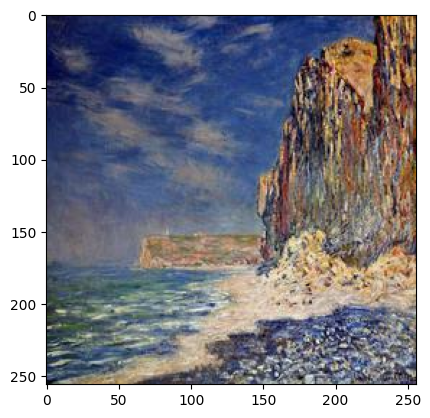

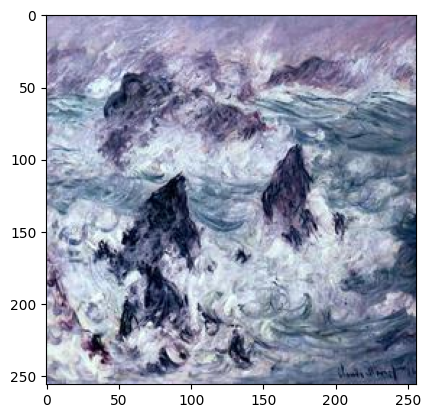

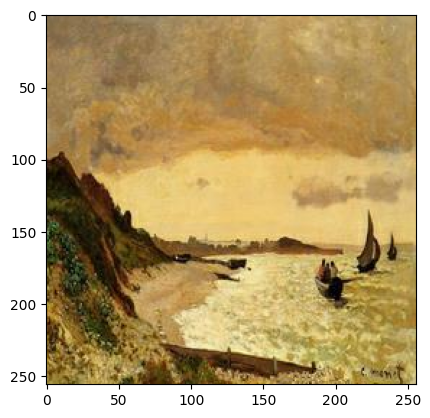

In [5]:
from random import choices
from PIL import Image

for sample_img in choices(monet_jpg_filepaths, k=3):
    plt.imshow(Image.open(sample_img))
    plt.show()

Let's inspect the non-monet images as well

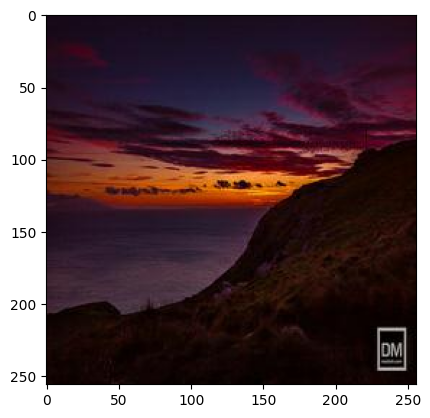

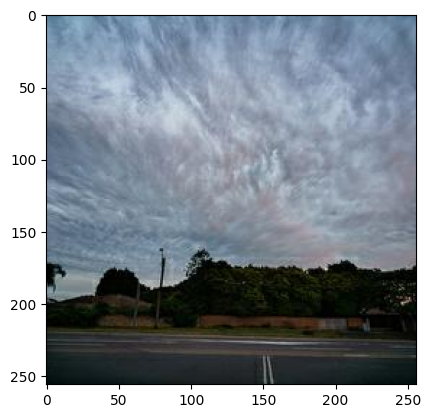

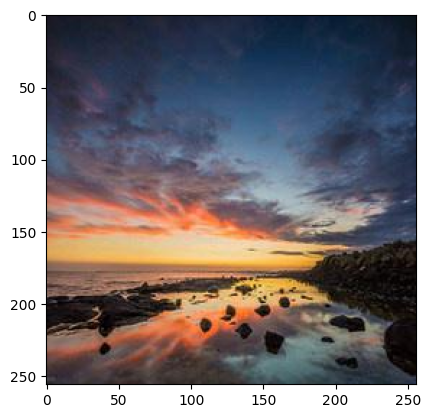

In [6]:

for sample_img in choices(photo_jpg_filepaths, k=3):
    plt.imshow(Image.open(sample_img))
    plt.show()

In [7]:
def mean_color_distribution(img_filepaths):
        
    mean_channel_values = {
        'R' : [],
        'G' : [],
        'B' : []
    }
    
    for img_path in tqdm(img_filepaths):
        for channel in mean_channel_values:
            img = Image.open(img_path)
            mean_channel_values[channel].append(np.array(img.getchannel(channel)).mean())
        

    df_rgb = pd.DataFrame(mean_channel_values)
    print(df_rgb.mean())
    print(df_rgb.std())
    df_rgb.replace([np.inf, -np.inf], np.nan, inplace=True)
    
    sns.histplot(df_rgb['R'], bins=20, kde=True, label='R', color='red')
    sns.histplot(df_rgb['G'], bins=20, kde=True, label='G', color='green')
    sns.histplot(df_rgb['B'], bins=20, kde=True, label='B', color='blue')
    plt.legend()
    plt.show()

100%|██████████| 300/300 [00:02<00:00, 128.62it/s]
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


R    132.963005
G    133.727880
B    121.572679
dtype: float64
R    28.756461
G    28.997153
B    36.119315
dtype: float64


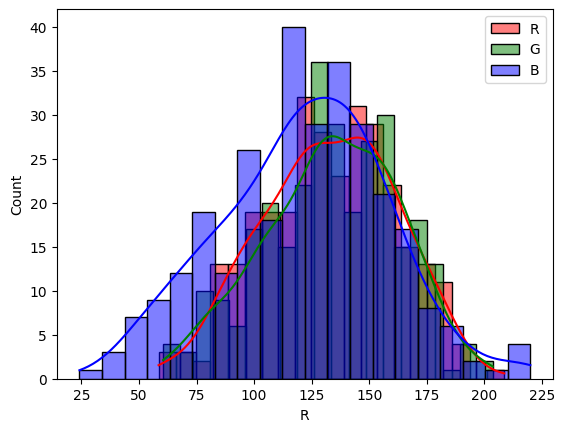

In [8]:
mean_color_distribution(monet_jpg_filepaths)

It's really interesting to see the color distribution shows a tendency for less blue color in monet paintings on average, but with much higher variance than the other colors. After looking it up I found the following relevant article:
https://www.forthepeoplecollective.org/monets-use-of-blue-in-his-paintings/

100%|██████████| 1000/1000 [00:08<00:00, 117.13it/s]


R    102.725457
G    103.755500
B     96.768247
dtype: float64
R    35.203776
G    33.952266
B    38.987912
dtype: float64


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


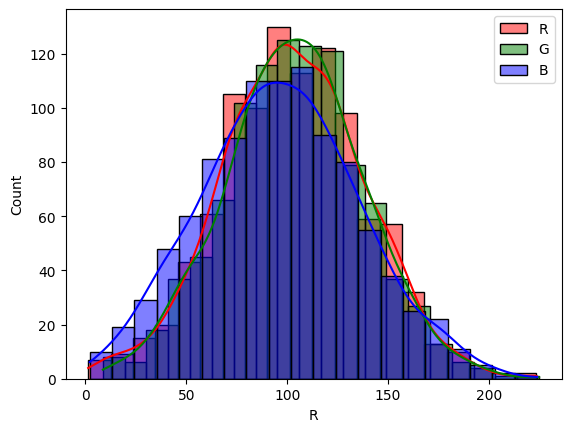

In [9]:
mean_color_distribution(choices(photo_jpg_filepaths,k=1000))

On the other hand, in a sampled set of the real photos the colors are a bit more balanced.

# Model Architecture

We will first test a vanilla GAN network, since our images are pretty large (256x256), we will attempt to generate a resized smaller version of them.

## Vanilla GAN

A vanilla GAN consists of two neural networks, a generator and a discriminator, competing with each other. The generator creates synthetic data, while the discriminator tries to distinguish between real and synthetic data.

We will start with simple fully connected networks for the generator and discriminator.

In [10]:
discriminator = keras.Sequential(
    [
        keras.Input(shape=(256, 256, 3)),
        layers.Resizing(64,64),
        layers.Flatten(),
        
        layers.Dense(1024),
        layers.BatchNormalization(),
        layers.LeakyReLU(negative_slope=0.2),
        layers.Dropout(0.5),
        
        layers.Dense(512),
        layers.BatchNormalization(),
        layers.LeakyReLU(negative_slope=0.2),
        layers.Dropout(0.5),
        
        layers.Dense(256),
        layers.BatchNormalization(),
        layers.LeakyReLU(negative_slope=0.2),
        layers.Dropout(0.5),
        
        layers.Dense(1, activation="sigmoid"),
    ],
    name="discriminator_dense",
)
discriminator.summary()

Model: "discriminator_dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ resizing (Resizing)                  │ (None, 64, 64, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 12288)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1024)                │      12,583,936 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 1024)                │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 512)                 │         524,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │             257 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,247,489 (50.54 MB)

 Trainable params: 13,243,905 (50.52 MB)

 Non-trainable params: 3,584 (14.00 KB)

In [11]:
latent_dim = 128

generator = keras.Sequential(
    [
        keras.Input(shape=(latent_dim,)),
        
        layers.Dense(256),
        layers.BatchNormalization(),
        layers.LeakyReLU(negative_slope=0.2),
        layers.Dropout(0.2),

        layers.Dense(512),
        layers.BatchNormalization(),
        layers.LeakyReLU(negative_slope=0.2),
        layers.Dropout(0.2),

        layers.Dense(1024),
        layers.BatchNormalization(),
        layers.LeakyReLU(negative_slope=0.2),
        layers.Dropout(0.2),

        layers.Dense(64 * 64 * 3, activation="sigmoid"),
        layers.Reshape((64,64,3))

        
    ],
    name="generator_dense",
)
generator.summary()

Model: "generator_dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_4 (Dense)                      │ (None, 256)                 │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 512)                 │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_4 (LeakyReLU)            │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 1024)                │         525,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 1024)                │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_5 (LeakyReLU)            │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 12288)               │      12,595,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 64, 64, 3)           │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,292,288 (50.71 MB)

 Trainable params: 13,288,704 (50.69 MB)

 Non-trainable params: 3,584 (14.00 KB)

In [12]:
class GAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim, limit_d_loss=None):
        super().__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.seed_generator = keras.random.SeedGenerator(42)
        self.freeze_discriminator = False
        self.limit_d_loss = limit_d_loss

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super().compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    @tf.function
    def train_step(self, real_images):
        # Sample random points in the latent space
        batch_size = ops.shape(real_images)[0]
        random_latent_vectors = keras.random.normal(
            shape=(batch_size, self.latent_dim), seed=self.seed_generator
        )

        with tf.GradientTape() as d_tape, tf.GradientTape() as g_tape:
            # Generate a fake image with the generator
            generated_images = self.generator(random_latent_vectors, training=True)

            # Determine the outputs of the discriminator for the fake and a real image
            discriminator_fake_output = self.discriminator(generated_images,  training=True)
            discriminator_real_output = self.discriminator(real_images, training=True)
            
            # Calculate losses for discriminator
            generated_image_loss = self.loss_fn(ops.ones((batch_size, 1)), discriminator_fake_output)
            real_image_loss = self.loss_fn(ops.zeros((batch_size, 1)), discriminator_real_output)

            # Discriminator loss
            d_loss = generated_image_loss + real_image_loss

            # Experimental conditional training, to avoid the discriminator throwing off the model
            if self.freeze_discriminator or (self.limit_d_loss and d_loss < self.limit_d_loss):
                pass # We're skipping the weights update in these cases that limit the discriminator
            else:
                d_grads = d_tape.gradient(d_loss, self.discriminator.trainable_weights)
    
                self.d_optimizer.apply_gradients(
                    zip(d_grads, self.discriminator.trainable_weights)
                )

            # Generator loss
            g_loss = self.loss_fn(ops.zeros((batch_size, 1)), discriminator_fake_output)
            g_grads = g_tape.gradient(g_loss, self.generator.trainable_weights)
            self.g_optimizer.apply_gradients(zip(g_grads, self.generator.trainable_weights))

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result(),
        }

In [13]:
gan_preview_images_dir = './progress_images/'
if not os.path.exists(gan_preview_images_dir):
    os.makedirs(gan_preview_images_dir)


class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=1, latent_dim=128, preview_freq=3):
        """
        A combined Keras callback to:
        1. Generate and save preview images every 'preview_freq' epochs
        2. Plot generator and discriminator losses every 'plot_interval' epochs

        Args:
            num_img (int): Number of preview images to generate per epoch.
            latent_dim (int): Latent dimension for the generator.
            preview_freq (int): Epoch frequency to generate preview images and loss plots.
        """
        super().__init__()
        self.num_img = num_img
        self.latent_dim = latent_dim
        self.preview_freq = preview_freq
        self.seed_generator = keras.random.SeedGenerator(42)

        # Loss plotting components
        self.gen_losses = []
        self.disc_losses = []
        self.epoch_count = 0

    def on_epoch_end(self, epoch, logs=None):
        self.epoch_count += 1


        # Preview during training every few epochs
        if self.preview_freq and epoch % self.preview_freq == 0:
            # 1. Image Generation and Preview
            random_latent_vectors = keras.random.normal(
                shape=(self.num_img, self.latent_dim), seed=self.seed_generator
            )
            generated_images = self.model.generator(random_latent_vectors, training=False)

            # generated_images += 1
            # generated_images /= 2
            generated_images *= 255
            generated_images_np = generated_images.numpy() # Convert to numpy once

            for i in range(self.num_img):
                img = keras.utils.array_to_img(generated_images_np[i]).resize((256,256))
                #img.save(os.path.join(gan_preview_images_dir,f"generated_img_epoch_{epoch:03d}_img_{i:02d}.png"))
                display(img)

        # 2. Loss Plotting
            gen_loss = logs.get('g_loss')
            disc_loss = logs.get('d_loss')

            if gen_loss and disc_loss: # Check if losses are available
                self.gen_losses.append(gen_loss)
                self.disc_losses.append(disc_loss)
                self.plot_losses()

    def plot_losses(self):
        plt.figure(figsize=(5, 3))
        plt.plot(self.gen_losses, label='Generator Loss')
        plt.plot(self.disc_losses, label='Discriminator Loss')
        plt.xlabel(f'Epochs (x{self.preview_freq})')
        plt.ylabel('Loss')
        plt.title('GAN Loss During Training')
        plt.legend()
        plt.grid(True)
        #plt.savefig('gan_loss_plot_epochs.png')
        plt.show()


In [14]:
batch_size = 128

In [15]:
dataset = keras.utils.image_dataset_from_directory(
    os.path.join(INPUT_BASEPATH,'monet_jpg'),
    labels=None,
    shuffle=True,
    batch_size=batch_size
)

Found 300 files.


In [16]:
g_lr = 2e-4
d_lr = 2e-4

gan = GAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)

#########################
#gan.freeze_discriminator = True # Testing
#########################

gan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=d_lr, beta_1=0.5, clipnorm=1),
    g_optimizer=keras.optimizers.Adam(learning_rate=g_lr, beta_1=0.5, clipnorm=1),
    loss_fn=keras.losses.BinaryCrossentropy(),
)

In [17]:
#checkpoint_dir = './gan_checkpoints'
#checkpoint_callback = keras.callbacks.ModelCheckpoint(os.path.join(checkpoint_dir,'dcgan_checkpoint.model.keras'), save_freq='epoch')

Epoch 1/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - d_loss: 1.7847 - g_loss: 0.8310  

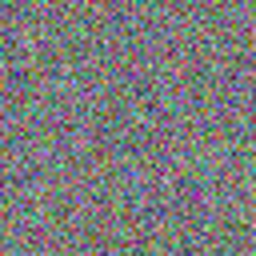

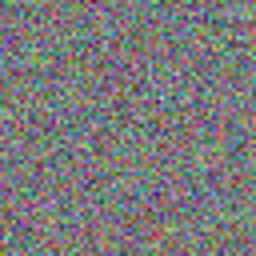

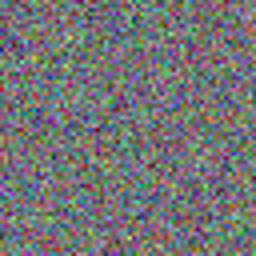

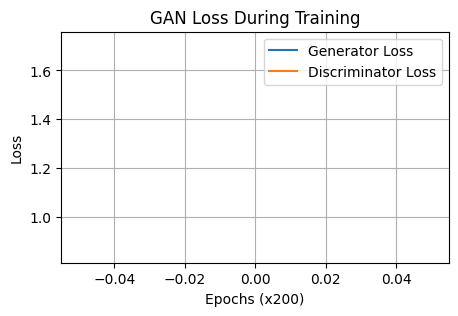

3/3 ━━━━━━━━━━━━━━━━━━━━ 25s 5s/step - d_loss: 1.7675 - g_loss: 0.8369
Epoch 2/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - d_loss: 1.8271 - g_loss: 0.9152
Epoch 3/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 1.8211 - g_loss: 0.8279
Epoch 4/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - d_loss: 1.7675 - g_loss: 0.8830
Epoch 5/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 1.8106 - g_loss: 0.8490
Epoch 6/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 1.7596 - g_loss: 0.8908
Epoch 7/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 1.6965 - g_loss: 0.9349
Epoch 8/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 1.7688 - g_loss: 0.8530
Epoch 9/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - d_loss: 1.7188 - g_loss: 0.8678
Epoch 10/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - d_loss: 1.7299 - g_loss: 0.8754
Epoch 11/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 1.6872 - g_loss: 0.8803
Epoch 12/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: 1.7148 - g_loss

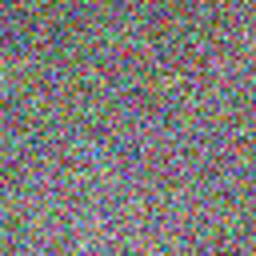

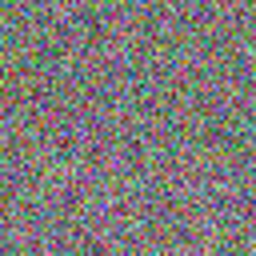

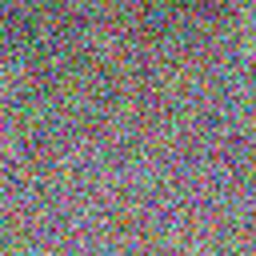

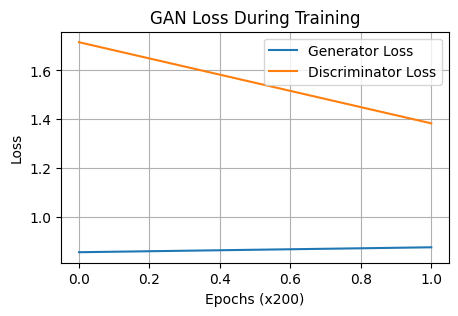

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - d_loss: 1.3768 - g_loss: 0.8745
Epoch 202/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 1.4158 - g_loss: 0.8674
Epoch 203/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - d_loss: 1.3759 - g_loss: 0.8199
Epoch 204/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 1.3335 - g_loss: 0.8600
Epoch 205/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 1.3933 - g_loss: 0.8004
Epoch 206/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - d_loss: 1.3864 - g_loss: 0.8437
Epoch 207/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 1.3560 - g_loss: 0.8715
Epoch 208/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - d_loss: 1.3736 - g_loss: 0.8449
Epoch 209/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - d_loss: 1.3477 - g_loss: 0.8653
Epoch 210/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 1.3195 - g_loss: 0.8614
Epoch 211/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 1.3561 - g_loss: 0.8918
Epoch 212/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - d_

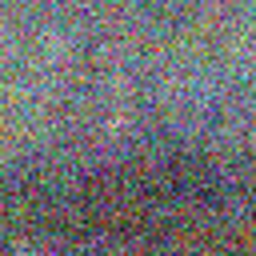

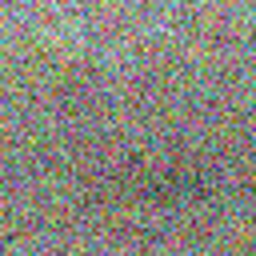

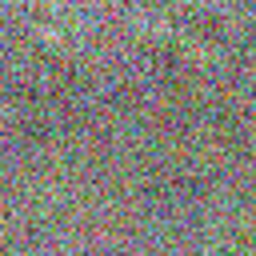

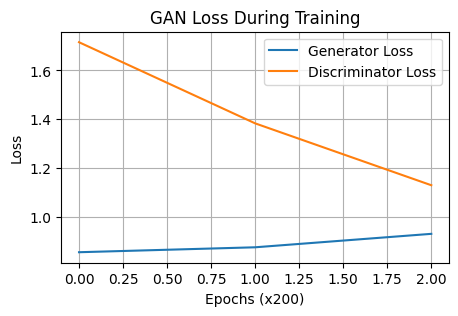

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - d_loss: 1.1242 - g_loss: 0.8969
Epoch 402/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: 1.1422 - g_loss: 0.9385
Epoch 403/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 1.1052 - g_loss: 0.9441
Epoch 404/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - d_loss: 1.1899 - g_loss: 0.9559
Epoch 405/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: 1.1362 - g_loss: 0.9160
Epoch 406/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - d_loss: 1.1220 - g_loss: 0.9043
Epoch 407/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 1.0645 - g_loss: 1.0124
Epoch 408/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - d_loss: 1.1796 - g_loss: 0.9332
Epoch 409/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - d_loss: 1.1745 - g_loss: 0.9756
Epoch 410/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - d_loss: 1.1547 - g_loss: 0.9781
Epoch 411/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 1.1182 - g_loss: 0.9420
Epoch 412/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - d_

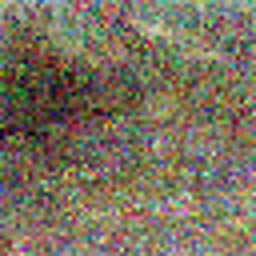

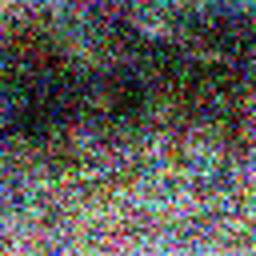

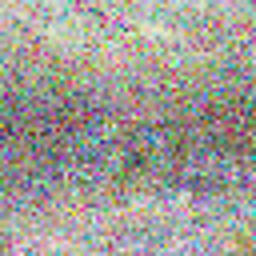

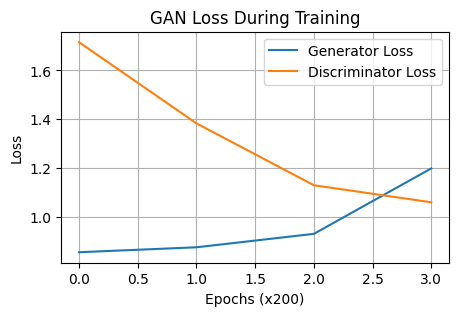

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - d_loss: 0.9906 - g_loss: 1.2032
Epoch 602/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 1.0453 - g_loss: 1.2525
Epoch 603/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - d_loss: 0.9417 - g_loss: 1.1763
Epoch 604/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - d_loss: 0.8942 - g_loss: 1.3434
Epoch 605/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 0.9235 - g_loss: 1.1355
Epoch 606/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 0.9515 - g_loss: 1.2323
Epoch 607/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.8898 - g_loss: 1.2574
Epoch 608/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.8297 - g_loss: 1.3073
Epoch 609/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - d_loss: 1.0824 - g_loss: 1.1950
Epoch 610/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.8886 - g_loss: 1.2348
Epoch 611/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - d_loss: 0.9289 - g_loss: 1.2099
Epoch 612/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - d_

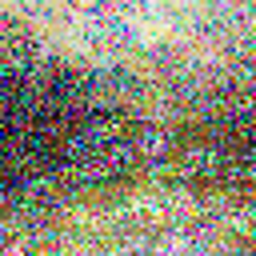

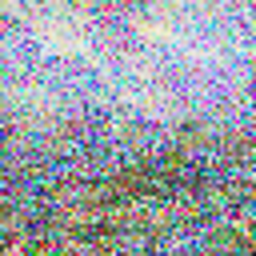

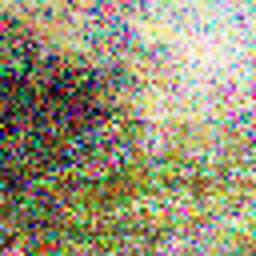

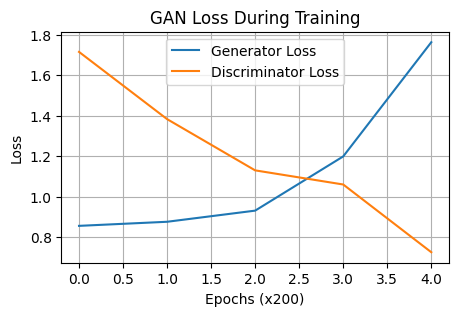

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - d_loss: 0.7691 - g_loss: 1.7065
Epoch 802/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.7745 - g_loss: 1.6535
Epoch 803/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 0.6698 - g_loss: 1.5805
Epoch 804/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - d_loss: 0.5824 - g_loss: 1.6787
Epoch 805/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - d_loss: 0.6714 - g_loss: 1.7225
Epoch 806/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 0.5677 - g_loss: 1.6043
Epoch 807/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.6339 - g_loss: 1.5864
Epoch 808/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.6420 - g_loss: 1.6537
Epoch 809/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - d_loss: 0.7526 - g_loss: 1.5693
Epoch 810/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - d_loss: 0.6111 - g_loss: 1.5887
Epoch 811/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 0.6450 - g_loss: 1.7564
Epoch 812/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - d_

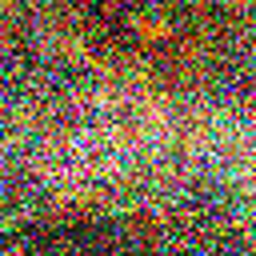

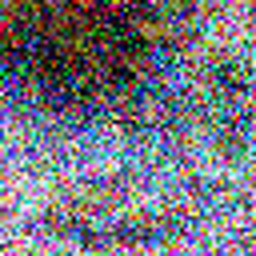

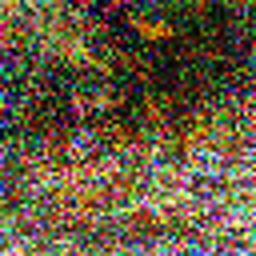

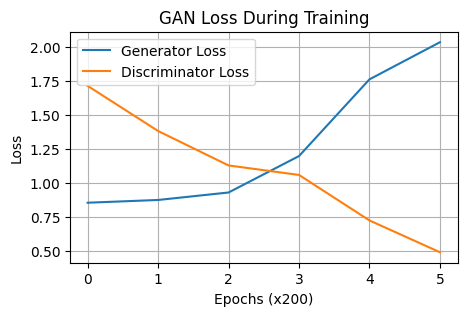

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - d_loss: 0.4831 - g_loss: 2.0689
Epoch 1002/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 0.6533 - g_loss: 1.9707
Epoch 1003/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.8138 - g_loss: 2.0734
Epoch 1004/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.5230 - g_loss: 2.0019
Epoch 1005/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 0.5063 - g_loss: 2.0562
Epoch 1006/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.6169 - g_loss: 1.8781
Epoch 1007/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - d_loss: 0.7114 - g_loss: 1.9426
Epoch 1008/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.6569 - g_loss: 1.9134
Epoch 1009/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.5676 - g_loss: 1.9722
Epoch 1010/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 0.9761 - g_loss: 2.0586
Epoch 1011/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.5300 - g_loss: 2.1721
Epoch 1012/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34m

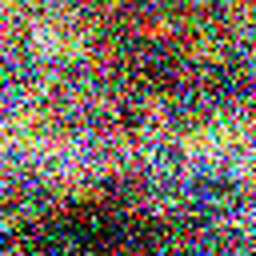

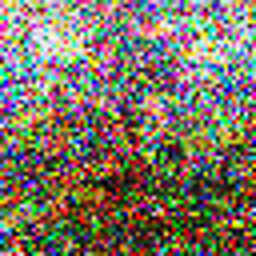

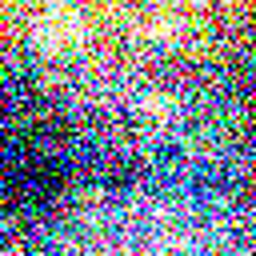

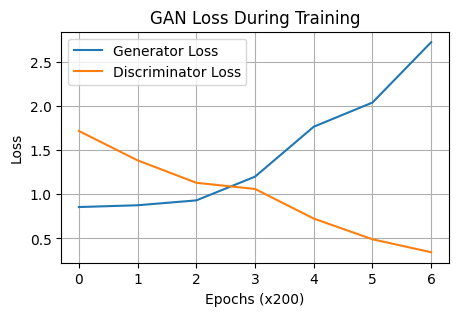

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 290ms/step - d_loss: 0.3490 - g_loss: 2.6386
Epoch 1202/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: 0.3652 - g_loss: 2.7768
Epoch 1203/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - d_loss: 0.3423 - g_loss: 2.8922
Epoch 1204/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.4296 - g_loss: 2.5733
Epoch 1205/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - d_loss: 0.3773 - g_loss: 2.6300
Epoch 1206/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 0.3925 - g_loss: 2.7268
Epoch 1207/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - d_loss: 0.3683 - g_loss: 2.5499
Epoch 1208/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 0.3507 - g_loss: 2.4981
Epoch 1209/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.4236 - g_loss: 2.7066
Epoch 1210/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - d_loss: 0.4566 - g_loss: 2.5416
Epoch 1211/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - d_loss: 0.5988 - g_loss: 2.6350
Epoch 1212/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 38m

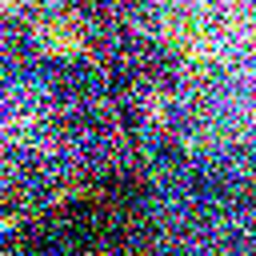

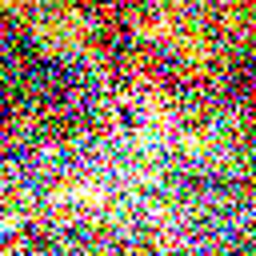

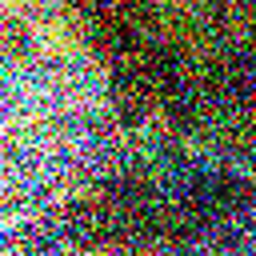

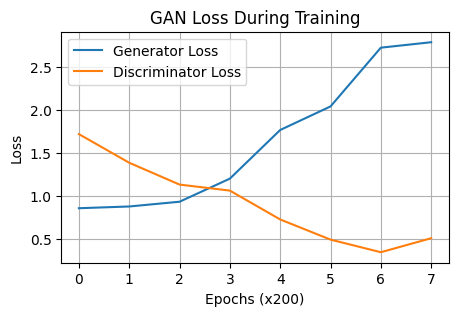

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - d_loss: 0.4185 - g_loss: 2.6878
Epoch 1402/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 0.2939 - g_loss: 2.9287
Epoch 1403/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.4228 - g_loss: 2.6722
Epoch 1404/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 0.2981 - g_loss: 3.0797
Epoch 1405/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.8929 - g_loss: 2.4967
Epoch 1406/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 0.3540 - g_loss: 2.5791
Epoch 1407/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - d_loss: 0.3792 - g_loss: 2.7416
Epoch 1408/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - d_loss: 0.3680 - g_loss: 2.5663
Epoch 1409/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.3469 - g_loss: 2.9426
Epoch 1410/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.5388 - g_loss: 2.9171
Epoch 1411/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.4173 - g_loss: 2.9355
Epoch 1412/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33m

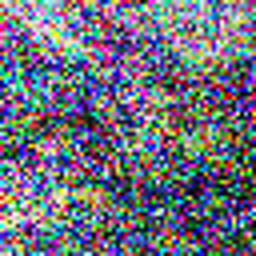

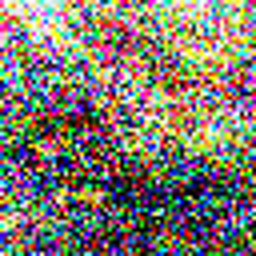

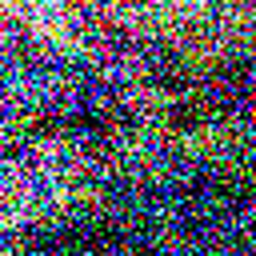

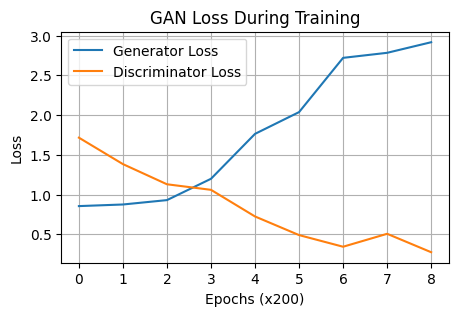

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - d_loss: 0.2694 - g_loss: 2.8973
Epoch 1602/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - d_loss: 0.2166 - g_loss: 3.2155
Epoch 1603/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.2509 - g_loss: 3.0414
Epoch 1604/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.2722 - g_loss: 3.1122
Epoch 1605/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - d_loss: 0.2590 - g_loss: 3.4930
Epoch 1606/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.4905 - g_loss: 3.0230
Epoch 1607/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.2127 - g_loss: 3.4110
Epoch 1608/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - d_loss: 0.2309 - g_loss: 3.1417
Epoch 1609/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - d_loss: 0.1956 - g_loss: 3.1797
Epoch 1610/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.2439 - g_loss: 3.0829
Epoch 1611/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.2020 - g_loss: 3.1683
Epoch 1612/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33m

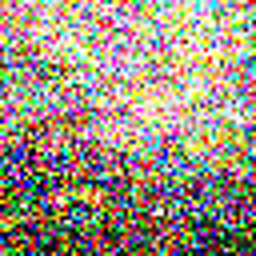

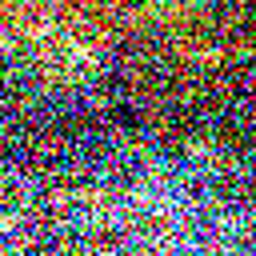

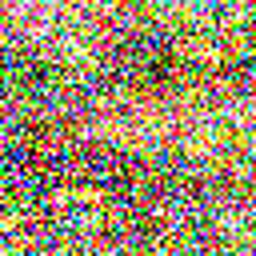

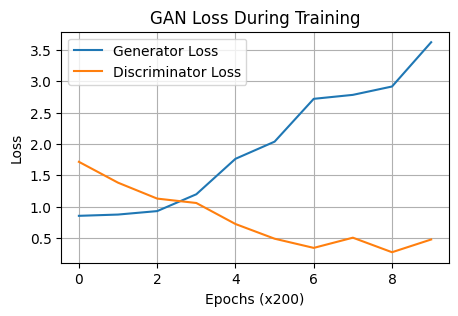

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - d_loss: 0.3278 - g_loss: 3.7432
Epoch 1802/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 0.3568 - g_loss: 3.8309
Epoch 1803/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - d_loss: 0.2328 - g_loss: 3.9011
Epoch 1804/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.3683 - g_loss: 3.7921
Epoch 1805/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 0.2049 - g_loss: 3.8847
Epoch 1806/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - d_loss: 0.2791 - g_loss: 3.1755
Epoch 1807/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 0.3075 - g_loss: 3.5259
Epoch 1808/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - d_loss: 0.3544 - g_loss: 3.6439
Epoch 1809/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - d_loss: 0.2173 - g_loss: 3.4158
Epoch 1810/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - d_loss: 0.2360 - g_loss: 3.5502
Epoch 1811/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - d_loss: 0.3068 - g_loss: 3.3798
Epoch 1812/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32m

In [18]:
epochs = 2000
history = gan.fit(
    dataset, epochs=epochs, callbacks=[GANMonitor(num_img=3, preview_freq=epochs//10,latent_dim=latent_dim)]
)

Generate a few images and see what is the model's output

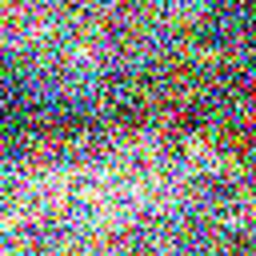

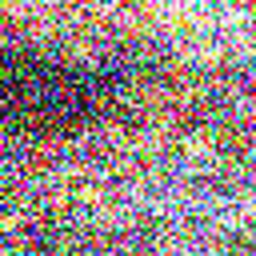

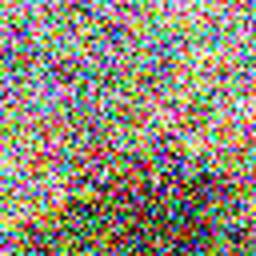

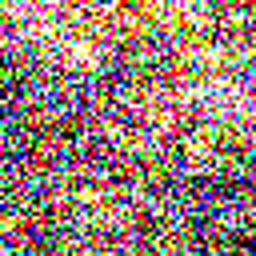

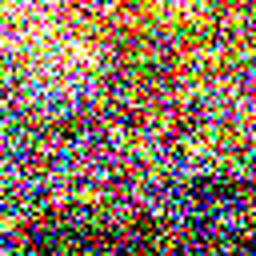

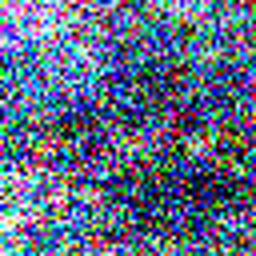

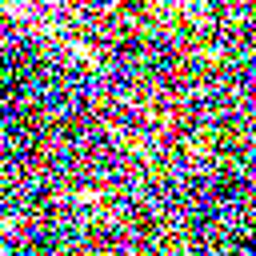

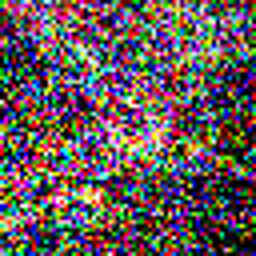

In [19]:
random_latent_vectors = keras.random.normal(
      shape=(8, latent_dim), seed=42
)
generated_images = gan.generator(random_latent_vectors, training=False)

for img in generated_images:
    display(keras.utils.array_to_img(img).resize((256,256)))

It looks like the network is catching on some interesting patterns such as using a pallete of similar colors, and having some shaded parts in the generated image. Overall not too bad!

# DCGAN

DCGANs (Deep Convolutional GANs) leverage convolutional layers in both the generator and discriminator, enabling them to learn hierarchical feature representations. This leads to more stable training and the generation of higher-quality images compared to vanilla GANs.
In this architecture we utilize the Conv2DTranspose layer to upsample the initial image.

In [20]:
discriminator = keras.Sequential(
    [
        keras.Input(shape=(256, 256, 3)),
        
        layers.Conv2D(32, kernel_size=3, strides=2, padding="same", kernel_initializer=initializers.RandomNormal(stddev=0.02)),
        layers.BatchNormalization(),
        layers.LeakyReLU(negative_slope=0.2),
        layers.Dropout(0.5),
        
        layers.Conv2D(64, kernel_size=3, strides=2, padding="same", kernel_initializer=initializers.RandomNormal(stddev=0.02)),
        layers.BatchNormalization(),
        layers.LeakyReLU(negative_slope=0.2),
        layers.Dropout(0.5),
        
        layers.Conv2D(128, kernel_size=3, strides=2, padding="same", kernel_initializer=initializers.RandomNormal(stddev=0.02)),
        layers.BatchNormalization(),
        layers.LeakyReLU(negative_slope=0.2),
        layers.Dropout(0.5),
        
        layers.Flatten(),
        layers.Dense(1, activation="sigmoid"),
    ],
    name="discriminator_dcgan",
)
discriminator.summary()

Model: "discriminator_dcgan"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 128, 128, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 128, 128, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_6 (LeakyReLU)            │ (None, 128, 128, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 128, 128, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 64, 64, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 64, 64, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_7 (LeakyReLU)            │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_8 (LeakyReLU)            │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 131072)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 1)                   │         131,073 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 225,217 (879.75 KB)

 Trainable params: 224,769 (878.00 KB)

 Non-trainable params: 448 (1.75 KB)

In [21]:
generator = keras.Sequential(
    [
        keras.Input(shape=(latent_dim,)),
        layers.Dense(8 * 8 * 1024, use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(negative_slope=0.2),

        layers.Reshape((8, 8, 1024)),
        
        layers.Conv2DTranspose(512, kernel_size=3, strides=2, use_bias=False, padding="same"),
        layers.BatchNormalization(),
        layers.LeakyReLU(negative_slope=0.2),
        layers.Dropout(0.2),
        
        layers.Conv2DTranspose(256, kernel_size=3, strides=2, use_bias=False, padding="same"),
        layers.BatchNormalization(),
        layers.LeakyReLU(negative_slope=0.2),
        layers.Dropout(0.2),
        
        layers.Conv2DTranspose(128, kernel_size=3, strides=2, use_bias=False, padding="same"),
        layers.BatchNormalization(),
        layers.LeakyReLU(negative_slope=0.2),
        layers.Dropout(0.2),
        
        layers.Conv2DTranspose(64, kernel_size=3, strides=2, use_bias=False, padding="same"),
        layers.BatchNormalization(),
        layers.LeakyReLU(negative_slope=0.2),
        layers.Dropout(0.2),

        layers.Conv2DTranspose(3, kernel_size=3, strides=2, use_bias=False, padding="same", activation="sigmoid"),

        
        #layers.Conv2D(3, kernel_size=5, padding="same", activation="sigmoid"),
    ],
    name="generator_dcgan",
)
generator.summary()

Model: "generator_dcgan"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_9 (Dense)                      │ (None, 65536)               │       8,388,608 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 65536)               │         262,144 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_9 (LeakyReLU)            │ (None, 65536)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_1 (Reshape)                  │ (None, 8, 8, 1024)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose (Conv2DTranspose)   │ (None, 16, 16, 512)         │       4,718,592 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_10               │ (None, 16, 16, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_10 (LeakyReLU)           │ (None, 16, 16, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 16, 16, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_1 (Conv2DTranspose) │ (None, 32, 32, 256)         │       1,179,648 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_11               │ (None, 32, 32, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_11 (LeakyReLU)           │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_10 (Dropout)                 │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_2 (Conv2DTranspose) │ (None, 64, 64, 128)         │         294,912 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_12               │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_12 (LeakyReLU)           │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_3 (Conv2DTranspose) │ (None, 128, 128, 64)        │          73,728 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_13               │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_13 (LeakyReLU)           │ (None, 128, 128, 64)        │              

 Total params: 14,923,200 (56.93 MB)

 Trainable params: 14,790,208 (56.42 MB)

 Non-trainable params: 132,992 (519.50 KB)

In [22]:
g_lr = 2e-4
d_lr = 1e-5

dc_gan = GAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim, limit_d_loss=0.2)

#########################
#gan.freeze_discriminator = True # Testing
#########################

dc_gan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=d_lr, beta_1=0.5, clipnorm=1),
    g_optimizer=keras.optimizers.Adam(learning_rate=g_lr, beta_1=0.5, clipnorm=1),
    loss_fn=keras.losses.BinaryCrossentropy(),
)

Epoch 1/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9s/step - d_loss: 1.9849 - g_loss: 0.6349   

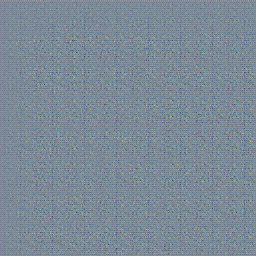

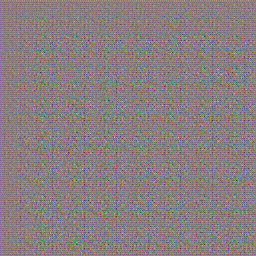

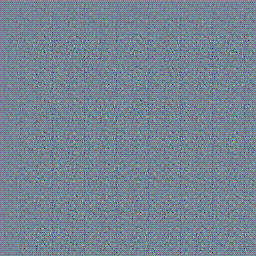

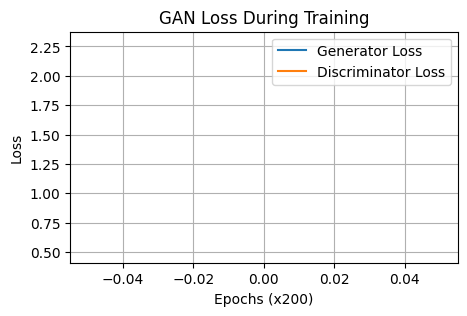

3/3 ━━━━━━━━━━━━━━━━━━━━ 53s 9s/step - d_loss: 2.0601 - g_loss: 0.6006
Epoch 2/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - d_loss: 3.4895 - g_loss: 0.1827
Epoch 3/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - d_loss: 4.4085 - g_loss: 0.1012
Epoch 4/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - d_loss: 5.0196 - g_loss: 0.0665
Epoch 5/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - d_loss: 5.2748 - g_loss: 0.0624
Epoch 6/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - d_loss: 5.2620 - g_loss: 0.0754
Epoch 7/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - d_loss: 5.1568 - g_loss: 0.0842
Epoch 8/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - d_loss: 5.0418 - g_loss: 0.0950
Epoch 9/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 228ms/step - d_loss: 5.2611 - g_loss: 0.0929
Epoch 10/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - d_loss: 4.9871 - g_loss: 0.1143
Epoch 11/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - d_loss: 5.1029 - g_loss: 0.1118
Epoch 12/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 230ms/step - d_loss: 5.19

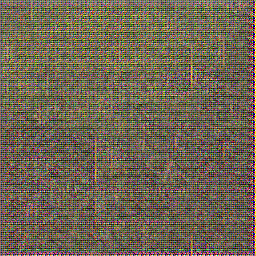

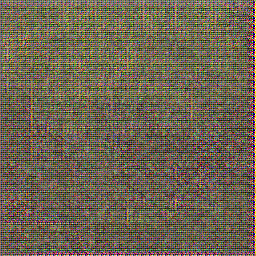

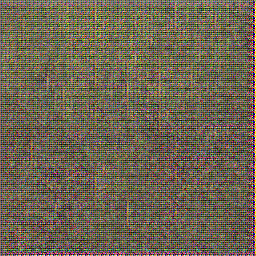

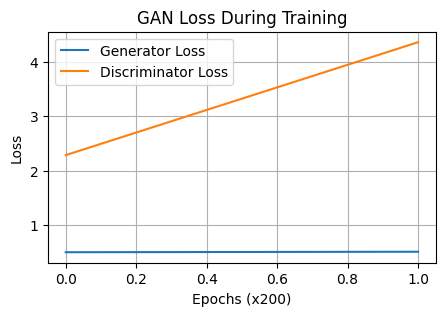

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 350ms/step - d_loss: 4.3433 - g_loss: 0.4941
Epoch 202/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 230ms/step - d_loss: 4.2902 - g_loss: 0.4965
Epoch 203/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - d_loss: 4.6377 - g_loss: 0.4721
Epoch 204/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 230ms/step - d_loss: 4.4379 - g_loss: 0.4770
Epoch 205/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 230ms/step - d_loss: 4.4974 - g_loss: 0.5277
Epoch 206/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 230ms/step - d_loss: 4.5474 - g_loss: 0.4635
Epoch 207/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 230ms/step - d_loss: 4.5650 - g_loss: 0.4760
Epoch 208/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 230ms/step - d_loss: 4.5938 - g_loss: 0.4819
Epoch 209/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 228ms/step - d_loss: 4.6265 - g_loss: 0.4736
Epoch 210/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 230ms/step - d_loss: 4.5921 - g_loss: 0.4874
Epoch 211/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 230ms/step - d_loss: 4.6373 - g_loss: 0.4461
Epoch 212/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 229m

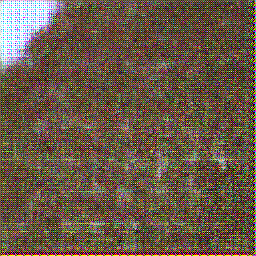

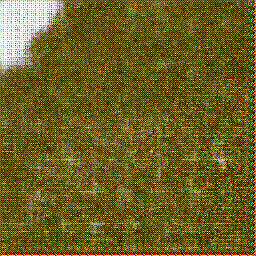

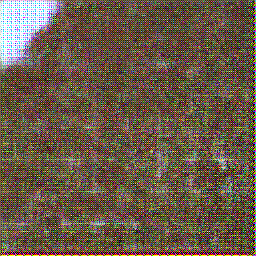

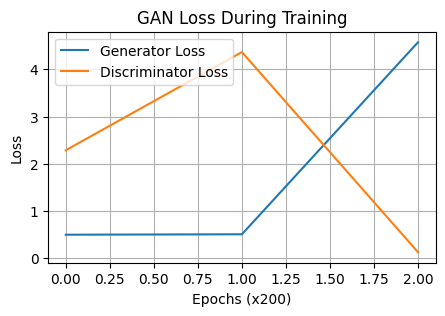

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 311ms/step - d_loss: 0.1256 - g_loss: 4.5310
Epoch 402/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 216ms/step - d_loss: 0.1505 - g_loss: 4.3731
Epoch 403/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 216ms/step - d_loss: 0.1884 - g_loss: 4.3997
Epoch 404/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step - d_loss: 0.1812 - g_loss: 4.8723
Epoch 405/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.1475 - g_loss: 4.7568
Epoch 406/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.1318 - g_loss: 4.6291
Epoch 407/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 228ms/step - d_loss: 0.1739 - g_loss: 4.7372
Epoch 408/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 227ms/step - d_loss: 0.1699 - g_loss: 4.4054
Epoch 409/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step - d_loss: 0.0969 - g_loss: 5.0141
Epoch 410/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 216ms/step - d_loss: 0.1645 - g_loss: 4.5552
Epoch 411/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step - d_loss: 0.1246 - g_loss: 4.5962
Epoch 412/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 215m

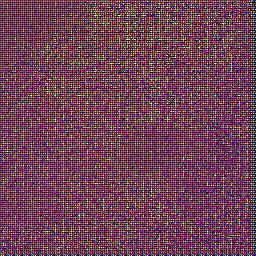

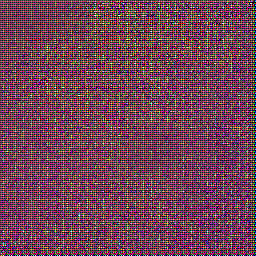

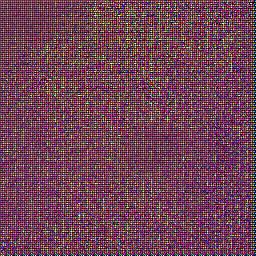

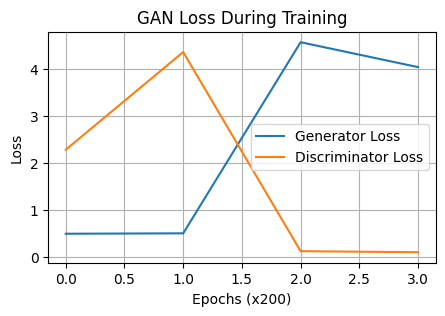

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 304ms/step - d_loss: 0.1300 - g_loss: 3.9897
Epoch 602/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 182ms/step - d_loss: 0.1459 - g_loss: 4.0217
Epoch 603/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.1215 - g_loss: 4.3769
Epoch 604/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.0919 - g_loss: 4.2546
Epoch 605/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step - d_loss: 0.1080 - g_loss: 4.1968
Epoch 606/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.0830 - g_loss: 4.1378
Epoch 607/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 182ms/step - d_loss: 0.1117 - g_loss: 3.8991
Epoch 608/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 182ms/step - d_loss: 0.0786 - g_loss: 3.9871
Epoch 609/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.1017 - g_loss: 3.8697
Epoch 610/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.1084 - g_loss: 3.8587
Epoch 611/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step - d_loss: 0.1152 - g_loss: 3.6633
Epoch 612/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184m

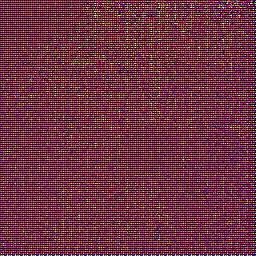

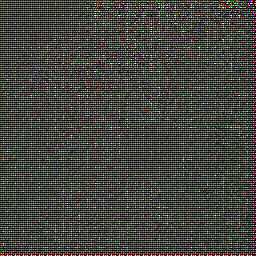

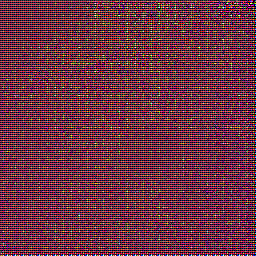

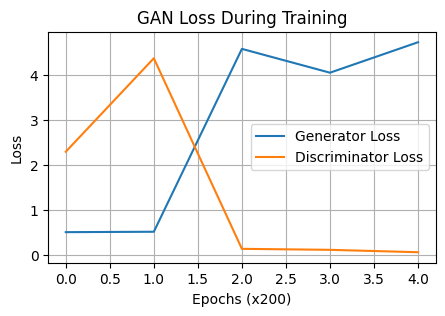

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 308ms/step - d_loss: 0.0646 - g_loss: 4.6543
Epoch 802/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.0653 - g_loss: 4.4294
Epoch 803/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.0951 - g_loss: 4.2207
Epoch 804/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.1021 - g_loss: 4.0306
Epoch 805/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step - d_loss: 0.0812 - g_loss: 4.1501
Epoch 806/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 182ms/step - d_loss: 0.0756 - g_loss: 4.1814
Epoch 807/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - d_loss: 0.1054 - g_loss: 4.2006
Epoch 808/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step - d_loss: 0.0745 - g_loss: 4.6947
Epoch 809/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step - d_loss: 0.0997 - g_loss: 4.4556
Epoch 810/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - d_loss: 0.1110 - g_loss: 4.3596
Epoch 811/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 182ms/step - d_loss: 0.0632 - g_loss: 4.6768
Epoch 812/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 183m

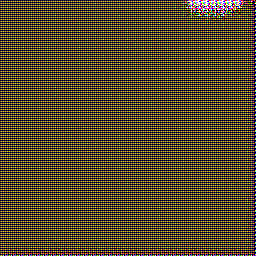

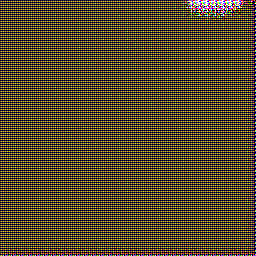

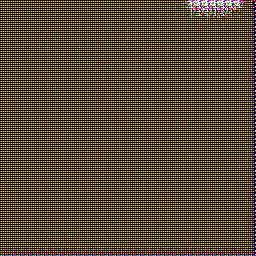

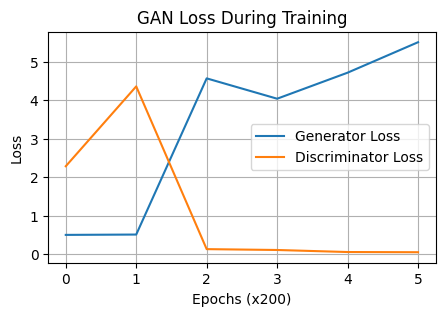

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 299ms/step - d_loss: 0.0480 - g_loss: 5.4969
Epoch 1002/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step - d_loss: 0.0411 - g_loss: 5.3748
Epoch 1003/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 182ms/step - d_loss: 0.0939 - g_loss: 5.0807
Epoch 1004/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.0607 - g_loss: 5.2613
Epoch 1005/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step - d_loss: 0.0678 - g_loss: 5.3142
Epoch 1006/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.0468 - g_loss: 5.3400
Epoch 1007/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.0911 - g_loss: 4.9556
Epoch 1008/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.0584 - g_loss: 5.2346
Epoch 1009/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.0707 - g_loss: 5.2426
Epoch 1010/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - d_loss: 0.0639 - g_loss: 5.1791
Epoch 1011/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 182ms/step - d_loss: 0.0915 - g_loss: 4.9656
Epoch 1012/2000
3/3 ━━━━━━━━━━━━━━━━━

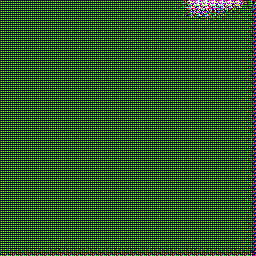

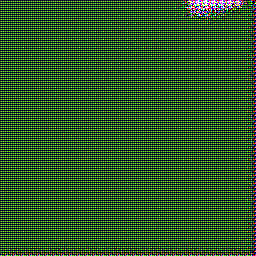

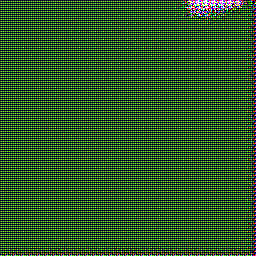

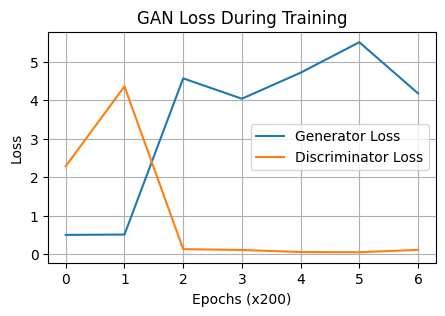

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 305ms/step - d_loss: 0.1091 - g_loss: 4.3383
Epoch 1202/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step - d_loss: 0.0918 - g_loss: 4.0863
Epoch 1203/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step - d_loss: 0.1407 - g_loss: 3.9476
Epoch 1204/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.1209 - g_loss: 4.2889
Epoch 1205/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.1148 - g_loss: 4.1587
Epoch 1206/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.0873 - g_loss: 4.0925
Epoch 1207/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.1423 - g_loss: 3.9087
Epoch 1208/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - d_loss: 0.1259 - g_loss: 4.0208
Epoch 1209/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 182ms/step - d_loss: 0.0760 - g_loss: 4.5936
Epoch 1210/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 182ms/step - d_loss: 0.0722 - g_loss: 4.7746
Epoch 1211/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step - d_loss: 0.0677 - g_loss: 4.8891
Epoch 1212/2000
3/3 ━━━━━━━━━━━━━━━━━

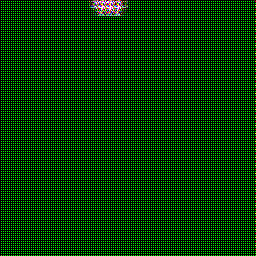

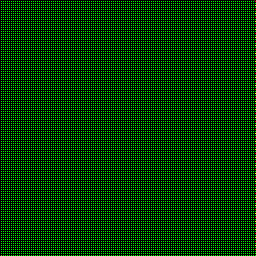

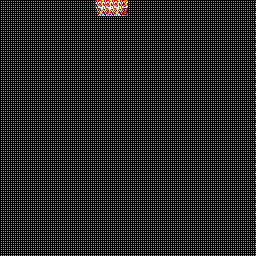

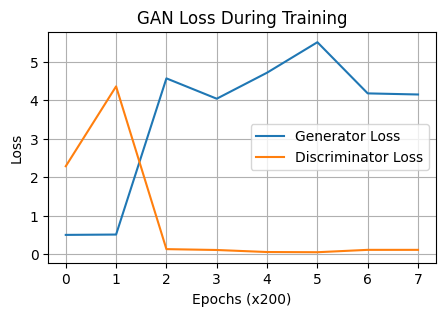

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 293ms/step - d_loss: 0.1059 - g_loss: 4.1794
Epoch 1402/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step - d_loss: 0.1476 - g_loss: 4.0715
Epoch 1403/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - d_loss: 0.1559 - g_loss: 4.0885
Epoch 1404/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step - d_loss: 0.1265 - g_loss: 4.4019
Epoch 1405/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 182ms/step - d_loss: 0.1285 - g_loss: 4.2266
Epoch 1406/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step - d_loss: 0.1062 - g_loss: 4.2812
Epoch 1407/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.1138 - g_loss: 4.2566
Epoch 1408/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.1117 - g_loss: 4.2350
Epoch 1409/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step - d_loss: 0.1159 - g_loss: 4.1749
Epoch 1410/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 182ms/step - d_loss: 0.1074 - g_loss: 4.2995
Epoch 1411/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.1150 - g_loss: 4.1878
Epoch 1412/2000
3/3 ━━━━━━━━━━━━━━━━━

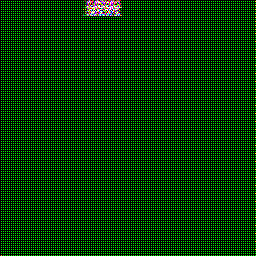

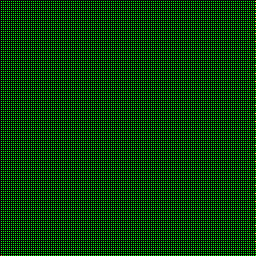

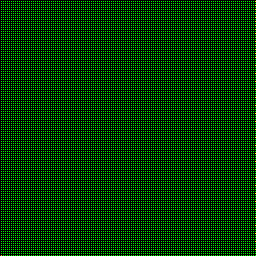

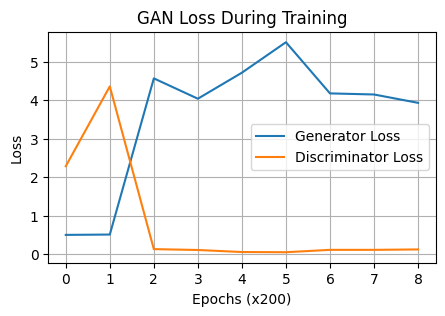

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 300ms/step - d_loss: 0.1101 - g_loss: 3.9664
Epoch 1602/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.0874 - g_loss: 3.8655
Epoch 1603/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step - d_loss: 0.0783 - g_loss: 4.0402
Epoch 1604/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step - d_loss: 0.0944 - g_loss: 4.0397
Epoch 1605/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.0972 - g_loss: 3.9572
Epoch 1606/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.0876 - g_loss: 4.0001
Epoch 1607/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step - d_loss: 0.0913 - g_loss: 3.8220
Epoch 1608/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.0837 - g_loss: 4.0384
Epoch 1609/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step - d_loss: 0.0631 - g_loss: 4.1139
Epoch 1610/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.0854 - g_loss: 3.8789
Epoch 1611/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.0886 - g_loss: 3.8693
Epoch 1612/2000
3/3 ━━━━━━━━━━━━━━━━━

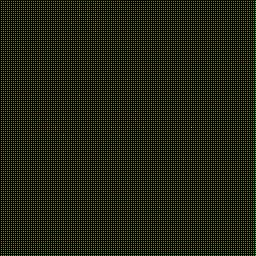

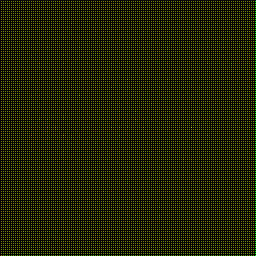

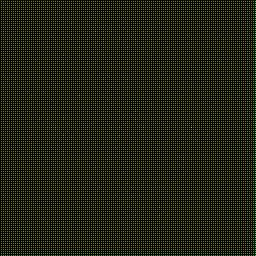

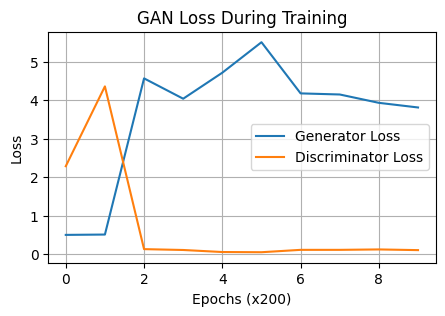

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 293ms/step - d_loss: 0.1030 - g_loss: 3.7942
Epoch 1802/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.0942 - g_loss: 3.7605
Epoch 1803/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - d_loss: 0.1198 - g_loss: 3.6597
Epoch 1804/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.1361 - g_loss: 3.7622
Epoch 1805/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.1086 - g_loss: 3.6163
Epoch 1806/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.1406 - g_loss: 3.7356
Epoch 1807/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - d_loss: 0.1291 - g_loss: 3.6183
Epoch 1808/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - d_loss: 0.1345 - g_loss: 3.6298
Epoch 1809/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 182ms/step - d_loss: 0.1014 - g_loss: 3.8275
Epoch 1810/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step - d_loss: 0.1265 - g_loss: 3.6107
Epoch 1811/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - d_loss: 0.1013 - g_loss: 3.7053
Epoch 1812/2000
3/3 ━━━━━━━━━━━━━━━━━

In [23]:
epochs = 2000
history = dc_gan.fit(
    dataset, epochs=epochs, callbacks=[GANMonitor(num_img=3, preview_freq=epochs//10,latent_dim=latent_dim)]
)

In [24]:
# Experimental, training the generator only for a couple epochs more
# gen_epochs = 10
# dc_gan.freeze_discriminator = True
# history_gen = dc_gan.fit(
#     dataset, epochs=gen_epochs, callbacks=[GANMonitor(num_img=3, preview_freq=1,latent_dim=latent_dim)]
# )

Generate a few images and see what is the model's output

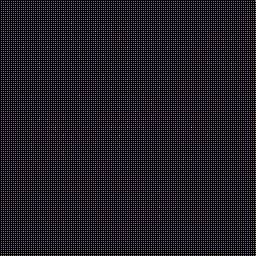

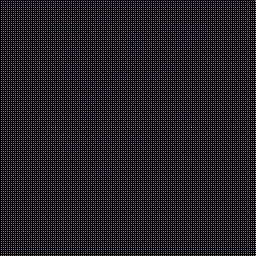

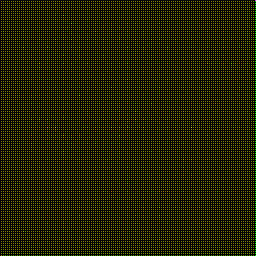

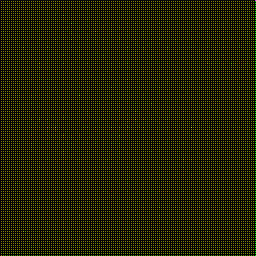

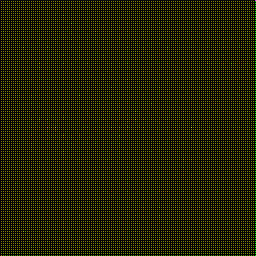

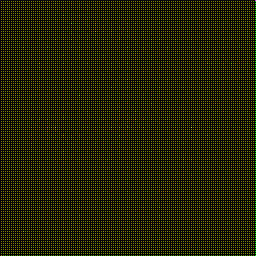

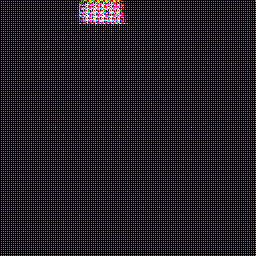

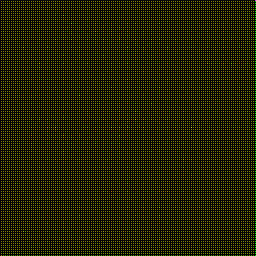

In [25]:
random_latent_vectors = keras.random.normal(
      shape=(8, latent_dim), seed=42
)
generated_images = dc_gan.generator(random_latent_vectors, training=False)

for img in generated_images:
    display(keras.utils.array_to_img(img).resize((256,256)))

I have attempted many different weaks of this DCGAN network, and have failed to generate any decent looking images.
Most of the attempts have resulted in the generator loss going up and keep rising.

The best looking images generated during training had some cloud looking patterns to them, and this was achieved by limiting the discriminator in an attempt to stop it from overpowering the generator.

# Evaluating and saving the resulting images

In [26]:
batches=60
output_dir='images'

if not os.path.exists(output_dir):
    os.mkdir(output_dir)

for i in range(batches):

  random_latent_vectors = keras.random.normal(
      shape=(batch_size, latent_dim), seed=42
  )
  generated_images = gan.generator(random_latent_vectors)
  for j,img in enumerate(generated_images):
      keras.utils.array_to_img(img).resize((256,256)).save(os.path.join(output_dir,f"batch_{i}_img_{j}.jpg"))


In [27]:
import zipfile

def zip_folder(folder_path, output_zip_path):
    """
    Zips a folder and its contents.

    Args:
        folder_path: The path to the folder to zip.
        output_zip_path: The path to the output zip file.  If the file
                         exists, it will be overwritten.
    Raises:
        FileNotFoundError: If the folder_path does not exist.
        ValueError: If `folder_path` is not a directory.
    """

    if not os.path.exists(folder_path):
        raise FileNotFoundError(f"Folder '{folder_path}' not found.")

    if not os.path.isdir(folder_path):
        raise ValueError(f"'{folder_path}' is not a directory.")

    try:
        with zipfile.ZipFile(output_zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
            for root, _, files in os.walk(folder_path):
                for file in files:
                    file_path = os.path.join(root, file)
                    arcname = os.path.relpath(file_path, folder_path)  # Important for correct paths within the archive
                    zipf.write(file_path, arcname=arcname)
        print(f"Folder '{folder_path}' zipped successfully to '{output_zip_path}'")

    except Exception as e:
        print(f"An error occurred during zipping: {e}")



In [28]:
zip_folder(output_dir,'images.zip')

Folder 'images' zipped successfully to 'images.zip'


In [29]:
!rm -rf images

# Conclusions



In this notebook, we implemented a vanilla GAN and a DCGAN network to generate images resembling Monet's style.

We observed the training process through generated image previews and loss plots,

showcasing the evolution of the generator's ability to mimic the artistic style.

It was tremendously challenging to achieve any stable training proccess, and to generate images that are not complete noise.

Part of the challenge was the delicate balance between the generator and discriminator, and part of it was lack of hardware.

Further improvements could involve exploring advanced architectures (CycleGAN, BigGAN),
hyperparameter tuning, and experimenting with different loss functions to enhance image quality and fidelity to Monet's style.  The small dataset size might have limited the performance, and using a larger, more diverse dataset might yield superior results.


